In [1]:
!pip install pytube ffmpeg-python

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.6/57.6 kB 809.0 kB/s eta 0:00:00


In [2]:
from google.colab import drive

# Montar Google Drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
!pip install ipywidgets

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 9.2 MB/s eta 0:00:00


In [4]:
from pytube import YouTube
import cv2
from google.colab.patches import cv2_imshow
import ipywidgets as widgets
from IPython.display import display

# Función para descargar el video desde YouTube
def download_video(link):
    yt = YouTube(link)
    stream = yt.streams.get_highest_resolution()
    try:
        stream.download(filename='downloaded_video.mp4')
        print("¡Descarga completada con éxito!")
    except Exception as e:
        print("Hubo un error al descargar el video del URL proporcionado...", e)

# Función para extraer frames del video
def extract_frames(video_path, interval=60):
    cap = cv2.VideoCapture(video_path)
    frame_count = 0
    frames = []

    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break
        if frame_count % interval == 0:
            frames.append(frame)
        frame_count += 1

    cap.release()
    return frames

# Función para realizar el reconocimiento de objetos
def recognize_objects(frames, prototxt, model, confidence_threshold=0.45):
    # Cargar el modelo
    net = cv2.dnn.readNetFromCaffe(prototxt, model)

    # Etiquetas de las clases
    classes = {0: "background", 1: "aeroplane", 2: "bicycle", 3: "bird", 4: "boat", 5: "bottle", 6: "bus",
               7: "car", 8: "cat", 9: "chair", 10: "cow", 11: "diningtable", 12: "dog", 13: "horse",
               14: "motorbike", 15: "person", 16: "pottedplant", 17: "sheep", 18: "sofa", 19: "train",
               20: "tvmonitor", 21: "rabbit"}

    results = []
    for frame in frames:
        height, width, _ = frame.shape
        frame_resized = cv2.resize(frame, (300, 300))

        # Crear un blob
        blob = cv2.dnn.blobFromImage(frame_resized, 0.007843, (300, 300), (127.5, 127.5, 127.5))

        # Detección y predicciones
        net.setInput(blob)
        detections = net.forward()

        frame_results = []
        for detection in detections[0][0]:
            if detection[2] > confidence_threshold:
                label = classes[int(detection[1])]
                box = detection[3:7] * [width, height, width, height]
                x_start, y_start, x_end, y_end = int(box[0]), int(box[1]), int(box[2]), int(box[3])
                frame_results.append((label, detection[2], (x_start, y_start, x_end, y_end)))
        results.append(frame_results)
    return results

# Función para mostrar resultados
def display_results(frames, results):
    for frame, frame_results in zip(frames, results):
        for label, confidence, (x_start, y_start, x_end, y_end) in frame_results:
            cv2.rectangle(frame, (x_start, y_start), (x_end, y_end), (0, 255, 0), 2)
            cv2.putText(frame, f"{label} ({confidence:.2f})", (x_start, y_start - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
        cv2_imshow(frame)



Text(value='', placeholder='Pega tu link de YouTube aquí, URL')

Button(description='Descargar Video', style=ButtonStyle())

Button(description='Procesar y Mostrar', style=ButtonStyle())

¡Descarga completada con éxito!


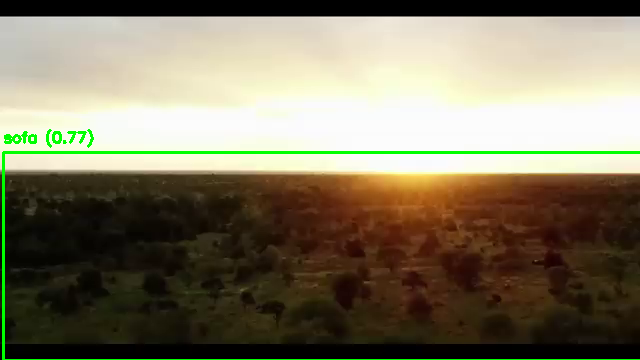

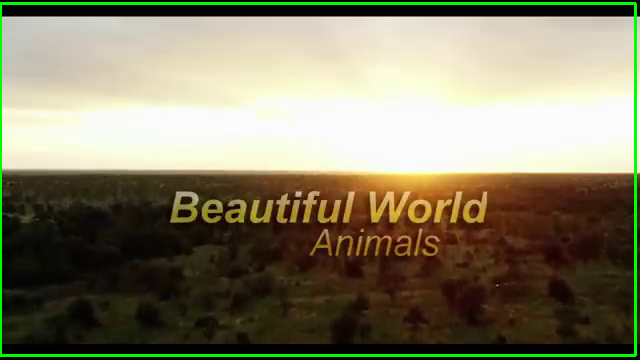

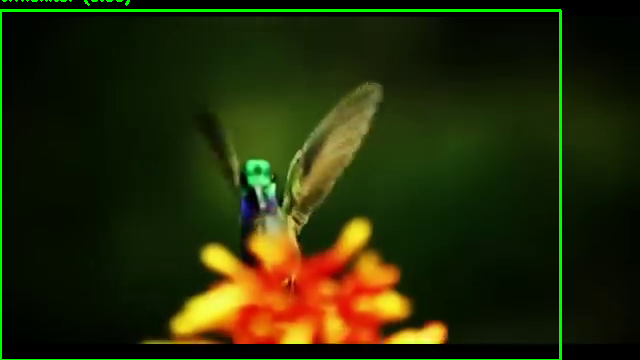

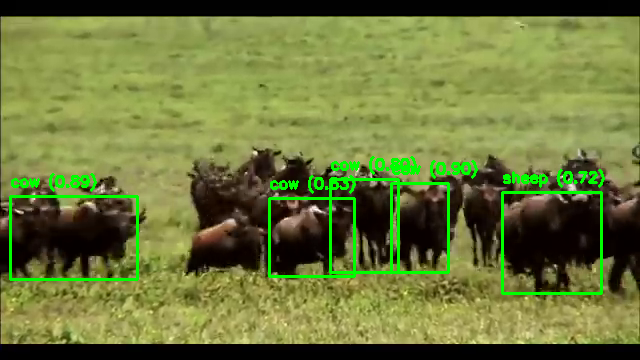

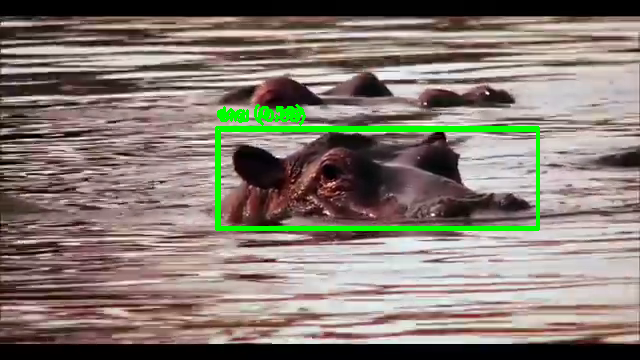

...

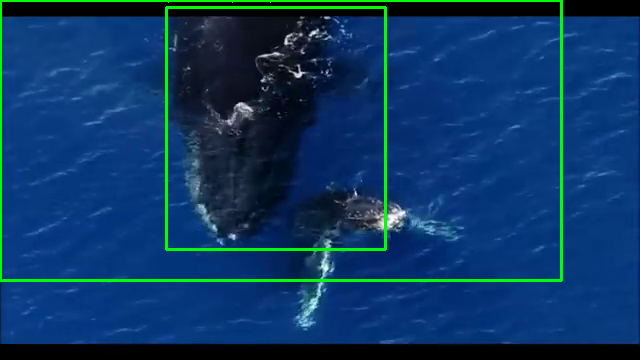

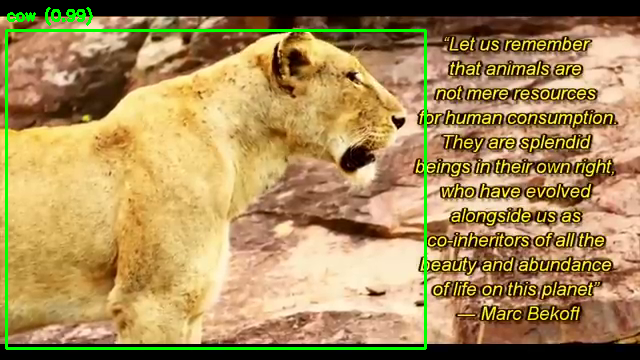

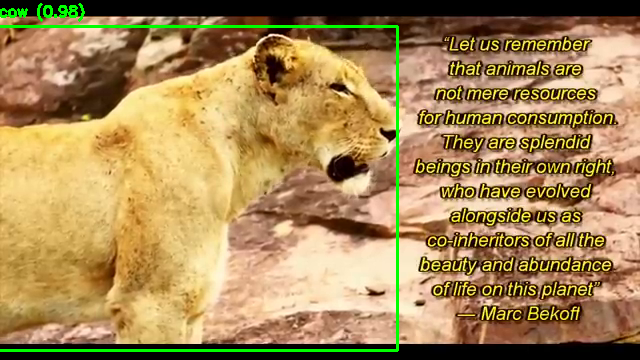

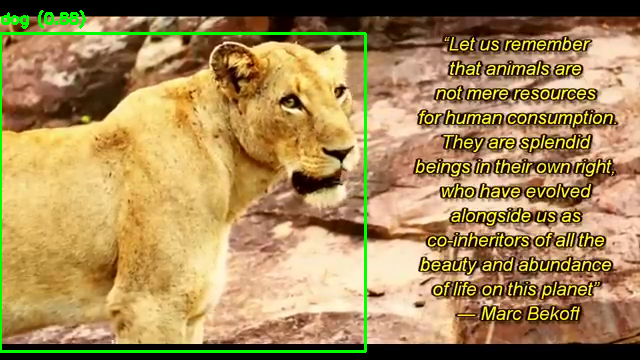

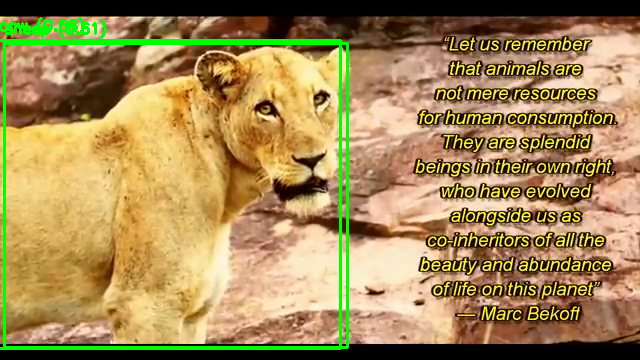

In [6]:
# Crear widgets para la interfaz de usuario
video_link = widgets.Text(placeholder='Pega tu link de YouTube aquí, URL')
download_button = widgets.Button(description="Descargar Video")
process_button = widgets.Button(description="Procesar y Mostrar")

# Función para manejar la descarga del video
def on_download_clicked(b):
    download_video(video_link.value)

# Función para manejar el procesamiento y muestra de resultados
def on_process_clicked(b):
    prototxt = '/content/drive/MyDrive/Semestre_9/Cloud_Computing/AWSPipeTube/dnn_object_detection/model/MobileNetSSD_deploy.prototxt.txt'
    model = '/content/drive/MyDrive/Semestre_9/Cloud_Computing/AWSPipeTube/dnn_object_detection/model/MobileNetSSD_deploy.caffemodel'

    # Extraer frames del video
    frames = extract_frames('downloaded_video.mp4', interval=60)

    # Realizar reconocimiento de objetos
    results = recognize_objects(frames, prototxt, model)

    # Mostrar resultados
    display_results(frames, results)

# Asociar funciones a los botones
download_button.on_click(on_download_clicked)
process_button.on_click(on_process_clicked)

# Mostrar widgets en la interfaz
display(video_link)
display(download_button)
display(process_button)
